In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [1]:
# load the dataset
file_path = 'data4JQ.csv'
data = pd.read_csv(file_path)

# displaying the first few rows of the dataset
data.head()

,X,Y,rig,time_lapsed_all,pred_lstm23_NV,time
0,0.68,1.34,1,0.092577,NaN,30:02.6
1,0.79,1.35,1,0.189712,0.0,30:02.7
2,0.84,1.22,1,0.292235,0.0,30:02.8
3,0.84,1.22,1,0.394320,0.0,30:02.9
4,0.91,1.28,1,0.592443,0.0,30:03.1


Checking Missing Values

In [2]:
# check for missing values
missing_values = data.isnull().sum()
missing_values

X                  0
Y                  0
rig                0
time_lapsed_all    0
pred_lstm23_NV     6
time               0
dtype: int64

Removing Missing Values

In [3]:
# remove missing values
data_clean = data.dropna(subset=['pred_lstm23_NV'])

# checking that there are no missing values left
missing_values_clean = data_clean.isnull().sum()
missing_values_clean

X                  0
Y                  0
rig                0
time_lapsed_all    0
pred_lstm23_NV     0
time               0
dtype: int64

Descriptive Analysis

In [4]:
# getting descriptive statistics
desc_stats = data_clean.describe()
desc_stats

,X,Y,rig,time_lapsed_all,pred_lstm23_NV
count,377613.000000,377613.000000,377613.000000,377613.000000,377613.000000
mean,5.457676,5.503597,3.491127,3945.050515,0.106429
std,1.749329,2.082281,1.754350,2532.630391,0.308386
min,-5.670000,-4.470000,1.000000,0.101038,0.000000
25%,4.290000,4.000000,2.000000,1791.773706,0.000000
50%,5.380000,5.530000,3.000000,3697.774391,0.000000
75%,6.960000,7.610000,5.000000,5835.268600,0.000000
max,9.730000,10.510000,6.000000,10147.525980,1.000000


Visualisations

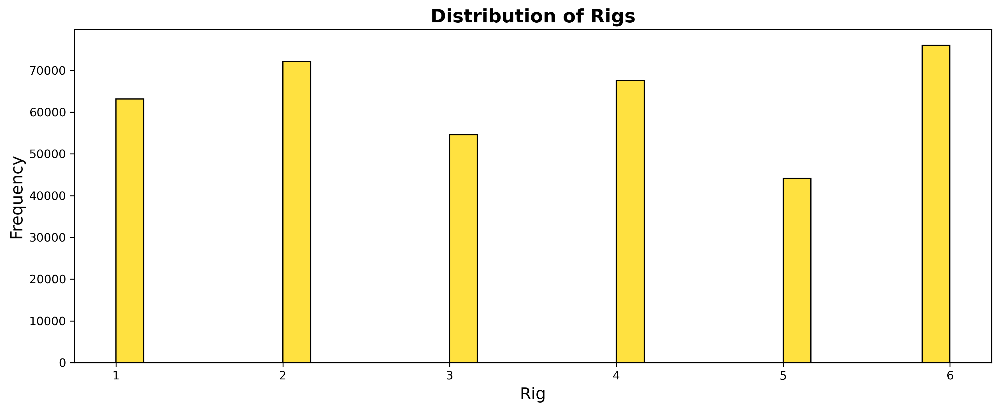

In [30]:
# Set up the figure size and DPI
plt.figure(figsize=(12, 5), dpi=300)  # Increase DPI for better quality

# Distribution plot for rig
sns.histplot(data_clean['rig'], bins=30, color='#FFD700', edgecolor='black')  # Gold color with black edges

# Improve title and labels
plt.title('Distribution of Rigs', fontsize=16, fontweight='bold')
plt.xlabel('Rig', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Optionally, display mean and median lines (if rig is numerical)
# mean_val = data_clean['rig'].mean()
# median_val = data_clean['rig'].median()
# plt.axvline(mean_val, color='blue', linestyle='--', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
# plt.axvline(median_val, color='green', linestyle='--', linewidth=1.5, label=f'Median: {median_val:.2f}')
# plt.legend()

# Tight layout for neatness
plt.tight_layout()

# Display the plot
plt.show()

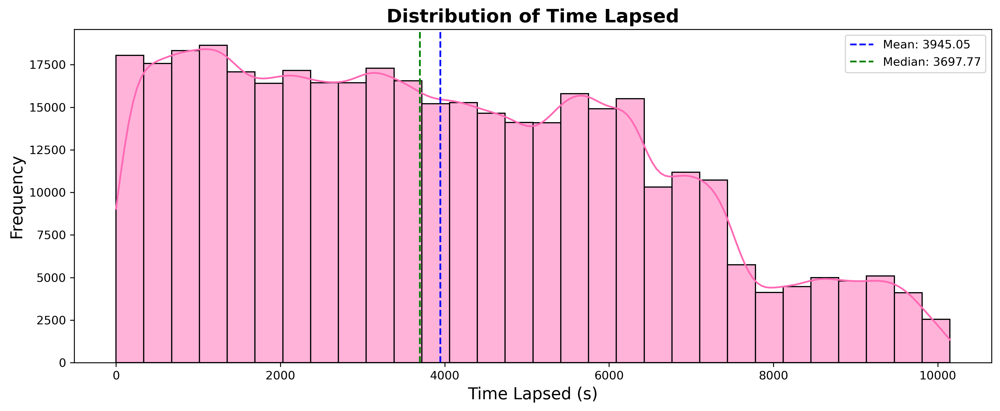

In [29]:
# Set up the figure size and DPI
plt.figure(figsize=(12, 5), dpi=300)  # Increase DPI for better quality

# Distribution plot for time_lapsed_all
sns.histplot(data_clean['time_lapsed_all'], bins=30, color='#FF69B4', kde=True, edgecolor='black')

# Improve title and labels
plt.title('Distribution of Time Lapsed', fontsize=16, fontweight='bold')
plt.xlabel('Time Lapsed (s)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Display mean and median as vertical lines (optional)
mean_val = data_clean['time_lapsed_all'].mean()
median_val = data_clean['time_lapsed_all'].median()
plt.axvline(mean_val, color='blue', linestyle='--', linewidth=1.5, label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='--', linewidth=1.5, label=f'Median: {median_val:.2f}')

# Add a legend to explain the vertical lines
plt.legend()

# Tight layout for neatness
plt.tight_layout()

# Display the plot
plt.show()

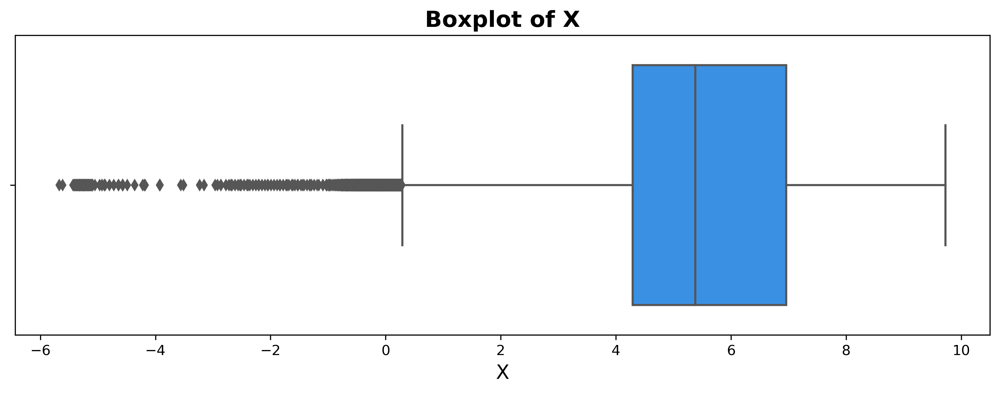

In [44]:
# Boxplot for X
plt.figure(figsize=(10, 4), dpi=300)  # Increase DPI for better quality
sns.boxplot(x=data_clean['X'].dropna(), orient='h', color='#1E90FF', linewidth=1.5)  # Blue color with thicker lines

# Improve title and labels
plt.title('Boxplot of X', fontsize=16, fontweight='bold')
plt.xlabel('X', fontsize=14)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

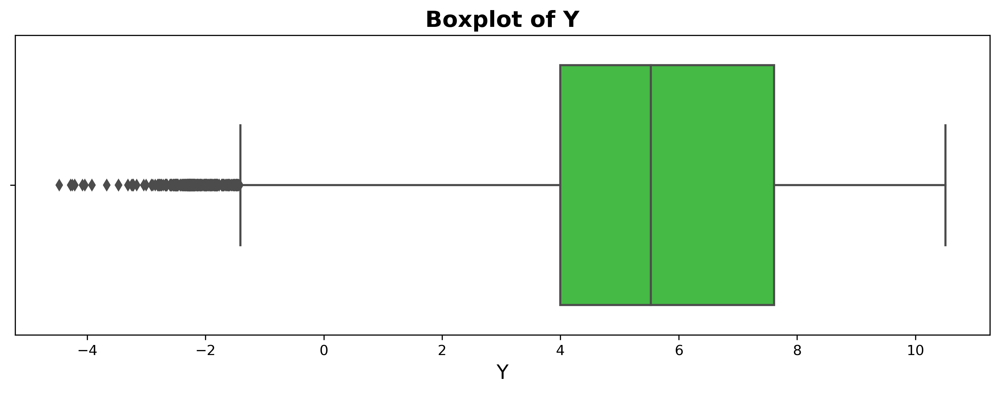

In [45]:
# Boxplot for Y
plt.figure(figsize=(10, 4), dpi=300)  # Increase DPI for better quality
sns.boxplot(x=data_clean['Y'].dropna(), orient='h', color='#32CD32', linewidth=1.5)  # Green color with thicker lines

# Improve title and labels
plt.title('Boxplot of Y', fontsize=16, fontweight='bold')
plt.xlabel('Y', fontsize=14)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

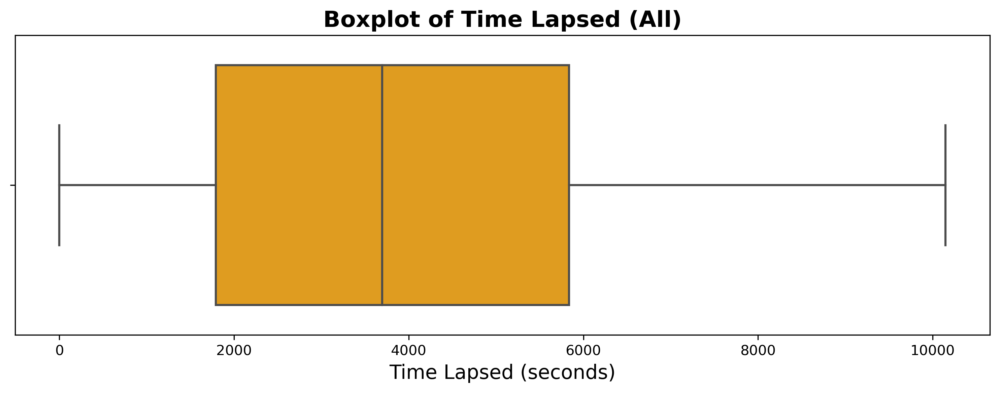

In [46]:
# Boxplot for time_lapsed_all
plt.figure(figsize=(10, 4), dpi=300)  # Increase DPI for better quality
sns.boxplot(x=data_clean['time_lapsed_all'].dropna(), orient='h', color='#FFA500', linewidth=1.5)  # Orange color with thicker lines

# Improve title and labels
plt.title('Boxplot of Time Lapsed (All)', fontsize=16, fontweight='bold')
plt.xlabel('Time Lapsed (seconds)', fontsize=14)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

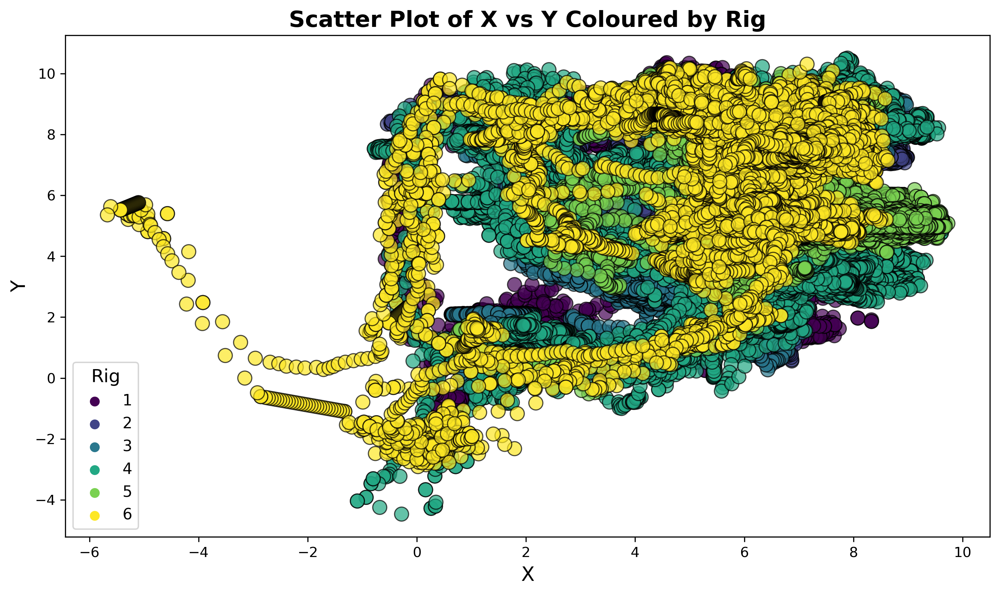

In [35]:
# Set up the figure size and DPI
plt.figure(figsize=(10, 6), dpi=300)  # Increase DPI for better quality

# Scatter plot of X vs Y, colored by rig
sns.scatterplot(x='X', y='Y', hue='rig', data=data, 
                palette='viridis', edgecolor='black', alpha=0.7, s=100)

# title and labels
plt.title('Scatter Plot of X vs Y Coloured by Rig', fontsize=16, fontweight='bold')
plt.xlabel('X', fontsize=14)
plt.ylabel('Y', fontsize=14)

# legend
plt.legend(title='Rig', title_fontsize='13', fontsize='11')

plt.tight_layout()

plt.show()

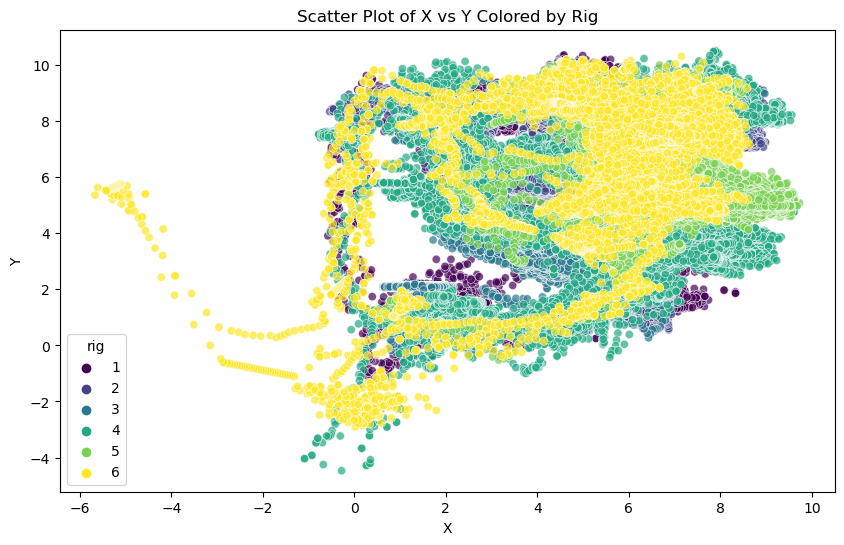

In [10]:
# set up the scatter plot
plt.figure(figsize=(10, 6))

# scatter plot of X vs Y, coloured by rig
sns.scatterplot(x='X', y='Y', hue='rig', data=data, palette='viridis', edgecolour='w', alpha=0.7)

# title and labels
plt.title('Scatter Plot of X vs Y Colored by Rig')
plt.xlabel('X')
plt.ylabel('Y')

plt.show()

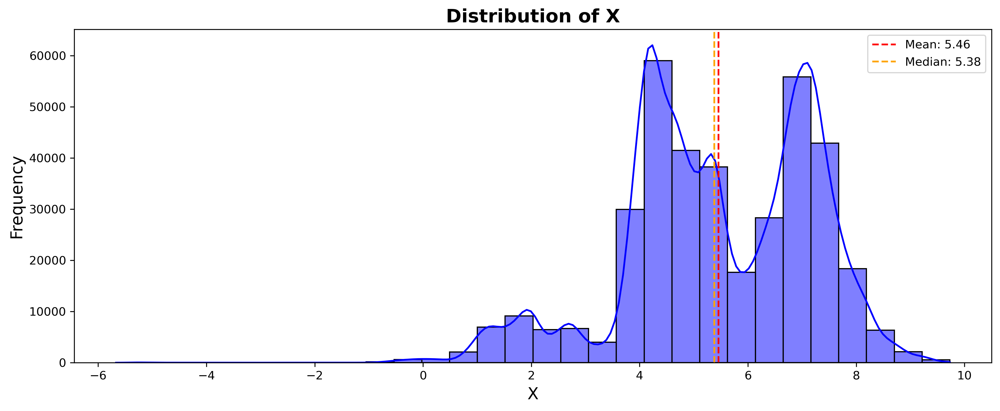

In [32]:
# set up the figure size and DPI
plt.figure(figsize=(12, 5), dpi=300)

# distribution plot for X
sns.histplot(data_clean['X'], kde=True, bins=30, color='blue', edgecolor='black')

# title and labels
plt.title('Distribution of X', fontsize=16, fontweight='bold')
plt.xlabel('X', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# display mean and median as vertical lines
mean_val_X = data_clean['X'].mean()
median_val_X = data_clean['X'].median()
plt.axvline(mean_val_X, color='red', linestyle='--', linewidth=1.5, label=f'Mean: {mean_val_X:.2f}')
plt.axvline(median_val_X, color='orange', linestyle='--', linewidth=1.5, label=f'Median: {median_val_X:.2f}')

plt.legend()

plt.tight_layout()

plt.show()

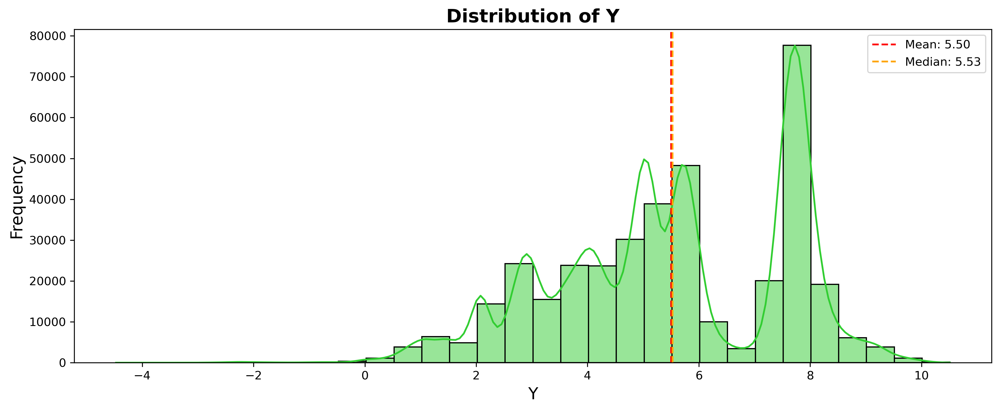

In [33]:
plt.figure(figsize=(12, 5), dpi=300)

# distribution plot for Y
sns.histplot(data_clean['Y'], kde=True, bins=30, color='#32CD32', edgecolor='black')  # Green color with black edges

# title and labels
plt.title('Distribution of Y', fontsize=16, fontweight='bold')
plt.xlabel('Y', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# display mean and median as vertical lines
mean_val_Y = data_clean['Y'].mean()
median_val_Y = data_clean['Y'].median()
plt.axvline(mean_val_Y, color='red', linestyle='--', linewidth=1.5, label=f'Mean: {mean_val_Y:.2f}')
plt.axvline(median_val_Y, color='orange', linestyle='--', linewidth=1.5, label=f'Median: {median_val_Y:.2f}')

plt.legend()

plt.tight_layout()

plt.show()

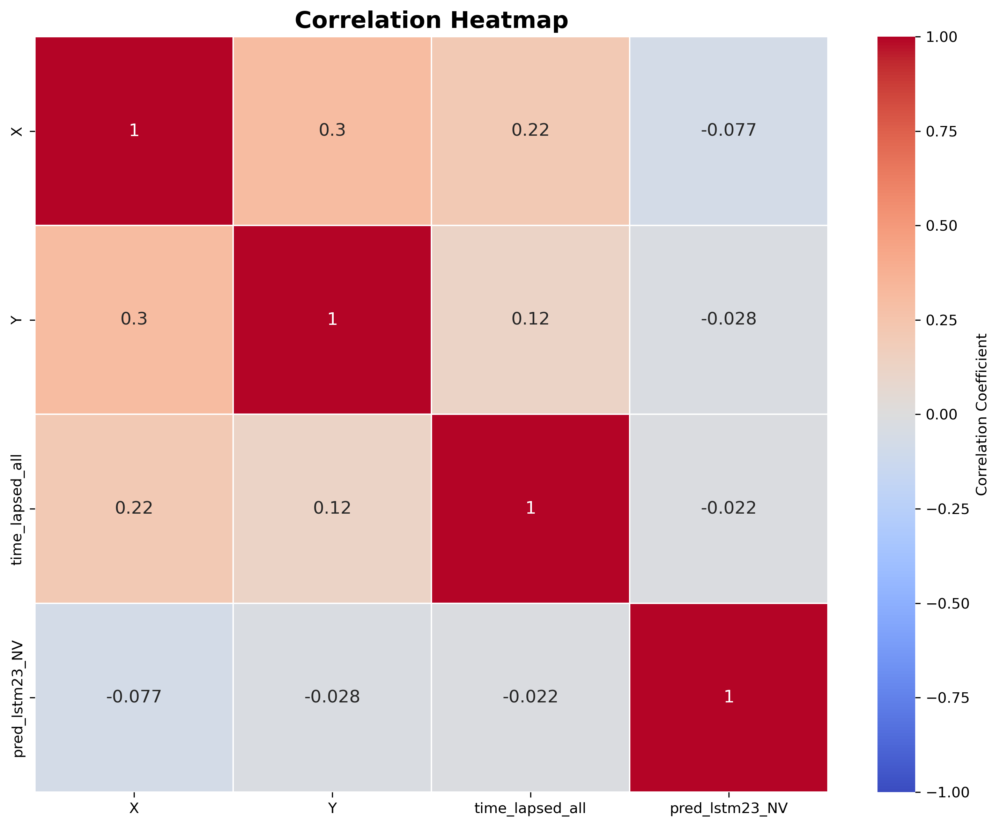

In [41]:
# plotting the columns
columns_to_plot = ['X', 'Y', 'time_lapsed_all', 'pred_lstm23_NV']  # Update with your relevant columns
correlation_matrix = data[columns_to_plot].corr()

# heatmap with colour scale
plt.figure(figsize=(10, 8), dpi=300)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5, 
            annot_kws={"size": 12}, cbar_kws={'label': 'Correlation Coefficient'})

# title and labels
plt.title('Correlation Heatmap', fontsize=16, fontweight='bold')

plt.tight_layout()

plt.show()

Movement Analysis

Transition Counts

In [13]:
# count transitions between dwelling and transit states
transitions = data_clean['pred_lstm23_NV'].diff().abs().sum()
transitions

11756.0

In [14]:
# calculating the difference between consecutive states
state_diff = data_clean['pred_lstm23_NV'].diff().abs()

# number of transitions count
transitions_count = state_diff.value_counts()

In [15]:
# creating df
transitions_df_corrected = pd.DataFrame({
    'Transition Type': ['No Transition', 'State Transition'],
    'Count': [transitions_count.get(0, 0), transitions_count.get(1, 0)]
})

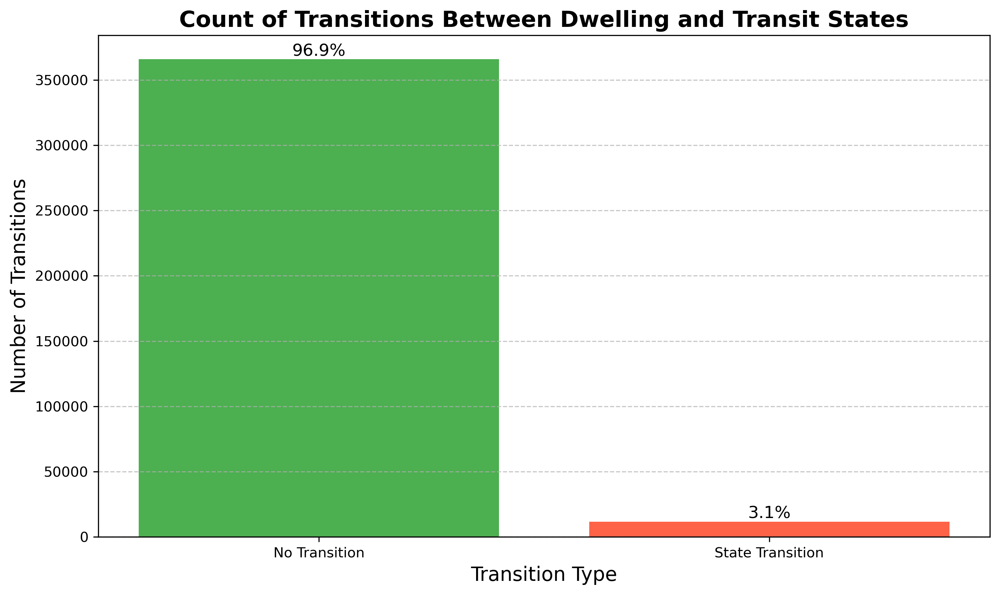

In [27]:
# calculate percentages
total_count = transitions_df_corrected['Count'].sum()
transitions_df_corrected['Percentage'] = (transitions_df_corrected['Count'] / total_count) * 100

# plot the transitions
plt.figure(figsize=(10, 6), dpi=300)
bars = plt.bar(transitions_df_corrected['Transition Type'], 
               transitions_df_corrected['Count'], 
               color=['#4CAF50', '#FF6347'])

# percentage labels above the bars
for bar in bars:
    yval = bar.get_height()
    percentage = yval / total_count * 100
    plt.text(bar.get_x() + bar.get_width()/2, yval + 5, f'{percentage:.1f}%', ha='center', va='bottom', fontsize=12)

# title and labels
plt.title('Count of Transitions Between Dwelling and Transit States', fontsize=16, fontweight='bold')
plt.ylabel('Number of Transitions', fontsize=14)
plt.xlabel('Transition Type', fontsize=14)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

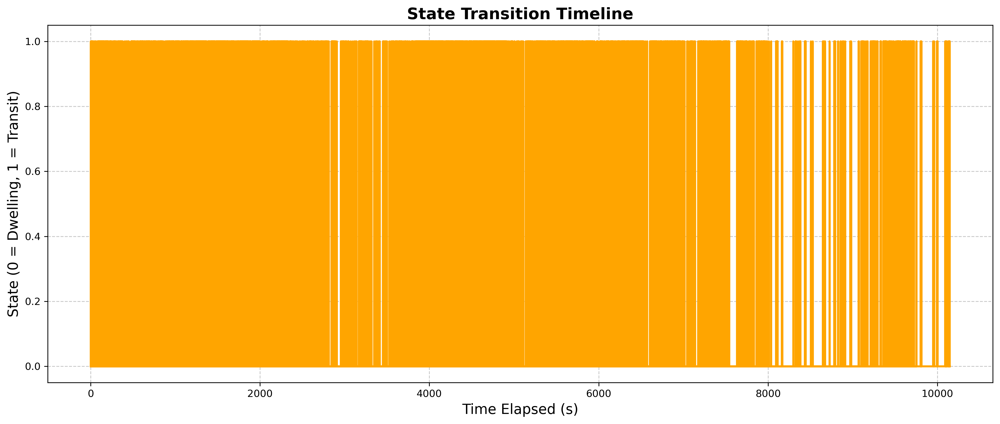

In [28]:
# state transitions over time
plt.figure(figsize=(14, 6), dpi=300)  # Increase DPI for better quality
plt.plot(data_clean['time_lapsed_all'], data_clean['pred_lstm23_NV'], 
         drawstyle='steps-post', color='#FFA500', linewidth=2)  # Use a hex color and increase line width

# title and labels
plt.title('State Transition Timeline', fontsize=16, fontweight='bold')
plt.xlabel('Time Elapsed (s)', fontsize=14)
plt.ylabel('State (0 = Dwelling, 1 = Transit)', fontsize=14)

plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()

plt.show()

Distribution of Time Spent in Each State

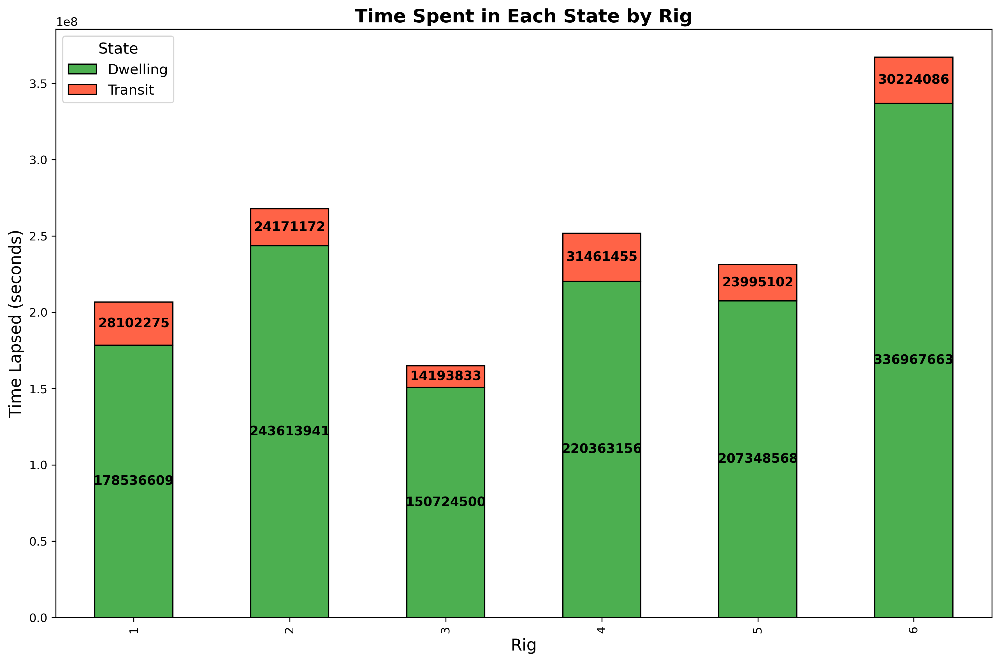

In [38]:
# calculating the time spent in each state for each rig
state_durations = data_clean.groupby(['rig', 'pred_lstm23_NV'])['time_lapsed_all'].sum().unstack()

# plotting the distribution of time spent in each state
ax = state_durations.plot(kind='bar', stacked=True, figsize=(12, 8), color=['#4CAF50', '#FF6347'], edgecolor='black')

# title and labels
plt.title('Time Spent in Each State by Rig', fontsize=16, fontweight='bold')
plt.xlabel('Rig', fontsize=14)
plt.ylabel('Time Lapsed (seconds)', fontsize=14)

# adding legend
plt.legend(['Dwelling', 'Transit'], fontsize=12, title='State', title_fontsize='13')

# adding percentage labels
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    ax.annotate(f'{height:.0f}', (x + width/2, y + height/2), ha='center', va='center', fontsize=11, color='black', fontweight='bold')

plt.tight_layout()

plt.gcf().set_dpi(300)

plt.show()

Time Series Analysis

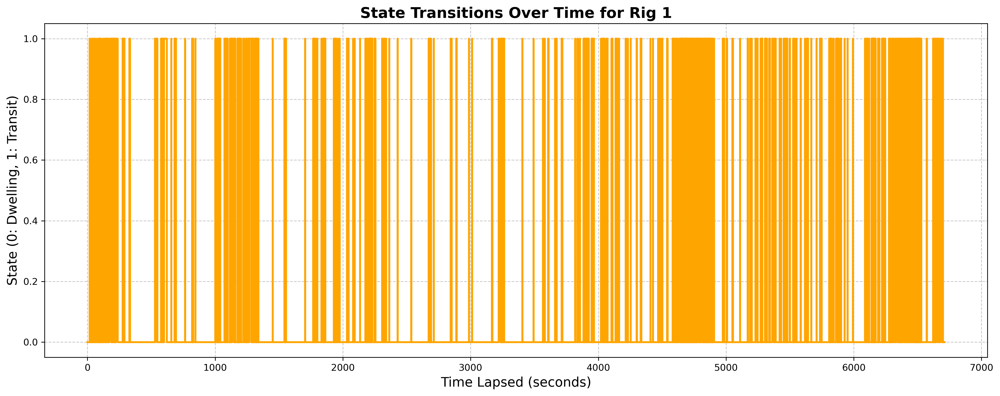

In [39]:
# filter data for the specific rig
rig_id = 1
rig_data = data_clean[data_clean['rig'] == rig_id]

# figure size
plt.figure(figsize=(15, 6), dpi=300)

# plot time series of state transitions for the specific rig
plt.plot(rig_data['time_lapsed_all'], rig_data['pred_lstm23_NV'], 
         drawstyle='steps-post', color='#FFA500', linewidth=2)

# title and labels
plt.title(f'State Transitions Over Time for Rig {rig_id}', fontsize=16, fontweight='bold')
plt.xlabel('Time Lapsed (seconds)', fontsize=14)
plt.ylabel('State (0: Dwelling, 1: Transit)', fontsize=14)

plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()

plt.show()

Clustering Movement Behaviours

c:\Users\Ashkan\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Ashkan\AppData\Local\Temp\ipykernel_7568\4141080403.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_clean['cluster'] = clusters


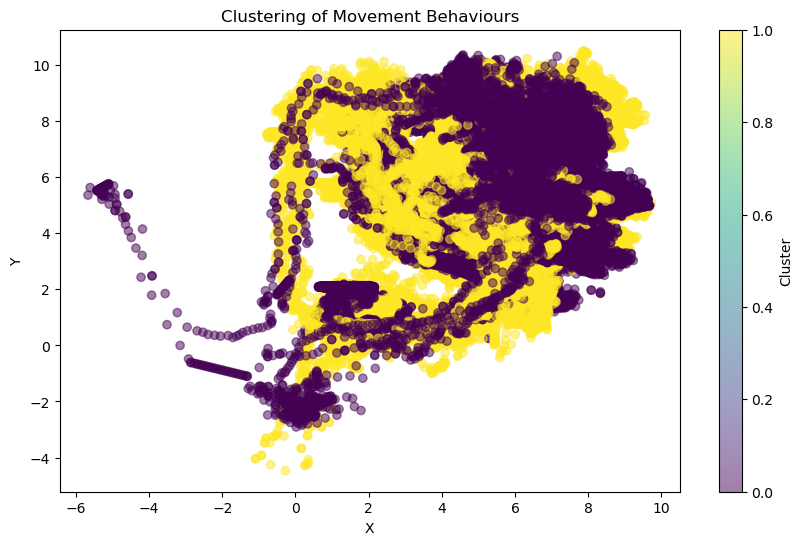

In [20]:
from sklearn.cluster import KMeans

# extracting features for clustering
features = data_clean[['X', 'Y', 'time_lapsed_all']]
kmeans = KMeans(n_clusters=2)
clusters = kmeans.fit_predict(features)

# adding cluster labels to the data
data_clean['cluster'] = clusters

# plotting the clusters
plt.figure(figsize=(10, 6))
plt.scatter(data_clean['X'], data_clean['Y'], c=data_clean['cluster'], cmap='viridis', alpha=0.5)
plt.colorbar(label='Cluster')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Clustering of Movement Behaviours')
plt.show()

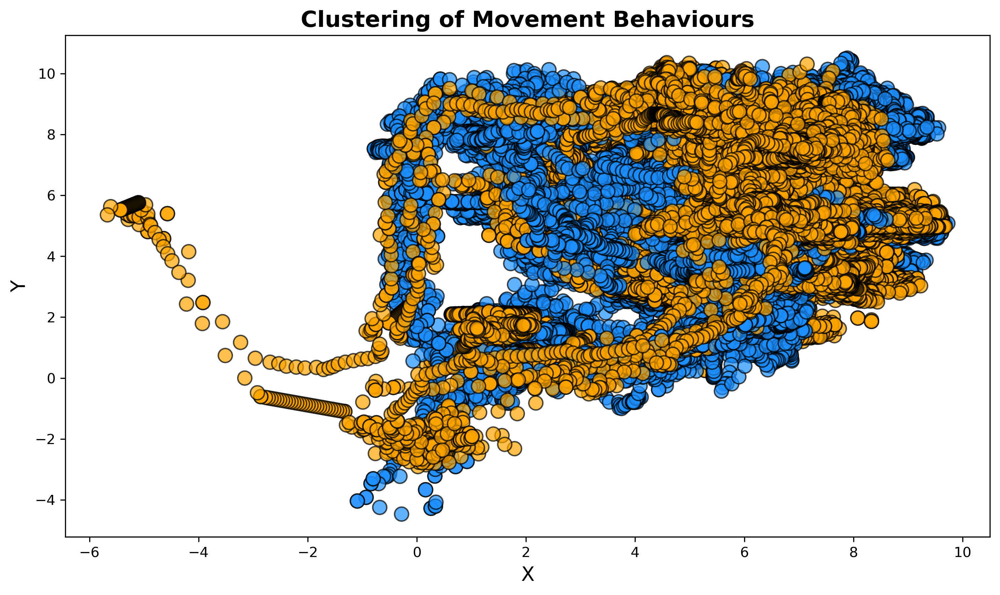

In [40]:
colors = np.array(['#1E90FF', '#FFA500'])

plt.figure(figsize=(10, 6), dpi=300)

# plotting each cluster
plt.scatter(data_clean['X'], data_clean['Y'], c=colors[data_clean['cluster']], 
            alpha=0.7, s=100, edgecolor='black')

# title and labels
plt.title('Clustering of Movement Behaviours', fontsize=16, fontweight='bold')
plt.xlabel('X', fontsize=14)
plt.ylabel('Y', fontsize=14)

plt.tight_layout()

plt.show()

Supervised Learning Algorithm

Data Preparation

In [50]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE

In [ ]:
# selecting features and the target
features = data_clean[['X', 'Y', 'time_lapsed_all', 'rig']]
target = data_clean['pred_lstm23_NV']

# splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# normalising the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# distribution of the target variable
target_distribution = data_clean['pred_lstm23_NV'].value_counts()
target_distribution

0.0    337424
1.0     40189
Name: pred_lstm23_NV, dtype: int64

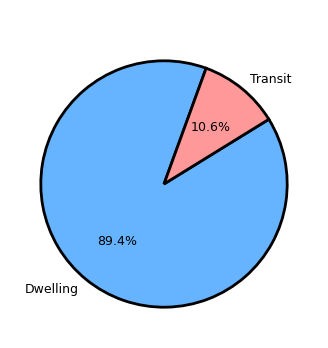

In [ ]:
plt.figure(figsize=(4, 4))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=70, colors=['#66b3ff','#ff9999'], 
        wedgeprops={'edgecolor': 'black', 'linewidth': 2}, textprops={'fontsize': 9})

plt.title(' ', fontsize=11, fontweight='bold')
plt.show()

In [ ]:
# oversampling using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

# checking the distribution of the resampled target variable
resampled_distribution = y_train_resampled.value_counts()
print(resampled_distribution)

0.0    269959
1.0    269959
Name: pred_lstm23_NV, dtype: int64


Logistic Regression

In [ ]:
# train logistic regression model
log_reg = LogisticRegression()
log_reg.fit(X_train_scaled, y_train)

# predict on the test set
y_pred_log_reg = log_reg.predict(X_test_scaled)

# evaluate the model
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_log_reg))
print("Classification Report:\n", classification_report(y_test, y_pred_log_reg))

Logistic Regression Accuracy: 0.8933040265879268
Classification Report:
               precision    recall  f1-score   support

         0.0       0.89      1.00      0.94     67465
         1.0       0.00      0.00      0.00      8058

    accuracy                           0.89     75523
   macro avg       0.45      0.50      0.47     75523
weighted avg       0.80      0.89      0.84     75523



c:\Users\Ashkan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Ashkan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Ashkan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Logistic Regression with Class Weights

In [ ]:
# train logistic regression model with class weights
log_reg = LogisticRegression(class_weight='balanced')
log_reg.fit(X_train_scaled, y_train)
y_pred_log_reg = log_reg.predict(X_test_scaled)

classification_report_log_reg = classification_report(y_test, y_pred_log_reg, output_dict=True)
print("Logistic Regression with Class Weights Accuracy:", accuracy_score(y_test, y_pred_log_reg))
print("Classification Report:\n", classification_report(y_test, y_pred_log_reg))

Logistic Regression with Class Weights Accuracy: 0.5247275664367147
Classification Report:
               precision    recall  f1-score   support

         0.0       0.91      0.52      0.66     67465
         1.0       0.12      0.56      0.20      8058

    accuracy                           0.52     75523
   macro avg       0.52      0.54      0.43     75523
weighted avg       0.82      0.52      0.61     75523



Logistic Regression Oversampled

In [ ]:
# train logistic regression model on resampled data
log_reg = LogisticRegression()
log_reg.fit(X_train_resampled, y_train_resampled)

# predict on the test set
y_pred_log_reg = log_reg.predict(X_test_scaled)

# evaluate the model
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_log_reg))
print("Classification Report:\n", classification_report(y_test, y_pred_log_reg))

Logistic Regression Accuracy: 0.5252042424162175
Classification Report:
               precision    recall  f1-score   support

         0.0       0.91      0.52      0.66     67465
         1.0       0.12      0.56      0.20      8058

    accuracy                           0.53     75523
   macro avg       0.52      0.54      0.43     75523
weighted avg       0.82      0.53      0.61     75523



Decision Tree

In [ ]:
# train decision tree model
tree_clf = DecisionTreeClassifier()
tree_clf.fit(X_train, y_train)

# predict on the test set
y_pred_tree = tree_clf.predict(X_test)

# evaluate the model
print("Decision Tree Accuracy:", accuracy_score(y_test, y_pred_tree))
print("Classification Report:\n", classification_report(y_test, y_pred_tree))

Decision Tree Accuracy: 0.9576288018219615
Classification Report:
               precision    recall  f1-score   support

         0.0       0.98      0.98      0.98     67465
         1.0       0.81      0.79      0.80      8058

    accuracy                           0.96     75523
   macro avg       0.89      0.89      0.89     75523
weighted avg       0.96      0.96      0.96     75523



Decision Tree with Class Weights

In [ ]:
# train decision tree model with class weights
tree_clf = DecisionTreeClassifier(class_weight='balanced')
tree_clf.fit(X_train, y_train)
y_pred_tree = tree_clf.predict(X_test)

classification_report_tree = classification_report(y_test, y_pred_tree, output_dict=True)
print("Decision Tree with Class Weights Accuracy:", accuracy_score(y_test, y_pred_tree))
print("Classification Report:\n", classification_report(y_test, y_pred_tree))

Decision Tree with Class Weights Accuracy: 0.9554572779153371
Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.98      0.98     67465
         1.0       0.80      0.77      0.79      8058

    accuracy                           0.96     75523
   macro avg       0.89      0.87      0.88     75523
weighted avg       0.95      0.96      0.96     75523



Decision Tree Oversampled

In [ ]:
# train decision tree model
tree_clf = DecisionTreeClassifier()
tree_clf.fit(X_train_resampled, y_train_resampled)

# predict on the test set
y_pred_tree = tree_clf.predict(X_test_scaled)

# evaluate the model
print("Decision Tree Accuracy:", accuracy_score(y_test, y_pred_tree))
print("Classification Report:\n", classification_report(y_test, y_pred_tree))

Decision Tree Accuracy: 0.9393032586099599
Classification Report:
               precision    recall  f1-score   support

         0.0       0.98      0.95      0.97     67465
         1.0       0.68      0.82      0.74      8058

    accuracy                           0.94     75523
   macro avg       0.83      0.89      0.85     75523
weighted avg       0.95      0.94      0.94     75523



Random Forest

In [ ]:
# train random forest model
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)  # Using non-scaled data for tree-based methods

# predict on the test set
y_pred_rf = rf_clf.predict(X_test)

# evaluate the model
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Classification Report:\n", classification_report(y_test, y_pred_rf))

Random Forest Accuracy: 0.9620777776306556
Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.99      0.98     67465
         1.0       0.88      0.74      0.81      8058

    accuracy                           0.96     75523
   macro avg       0.93      0.87      0.89     75523
weighted avg       0.96      0.96      0.96     75523



Random Forest with Class Weights

In [ ]:
# train random forest model with class weights
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf_clf.fit(X_train, y_train)
y_pred_rf = rf_clf.predict(X_test)

classification_report_rf = classification_report(y_test, y_pred_rf, output_dict=True)
print("Random Forest with Class Weights Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Classification Report:\n", classification_report(y_test, y_pred_rf))

Random Forest with Class Weights Accuracy: 0.961733511645459
Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.99      0.98     67465
         1.0       0.89      0.73      0.80      8058

    accuracy                           0.96     75523
   macro avg       0.93      0.86      0.89     75523
weighted avg       0.96      0.96      0.96     75523



Random Forest Oversampled

In [ ]:
# train random forest model
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train_resampled, y_train_resampled)

# predict on the test set
y_pred_rf = rf_clf.predict(X_test_scaled)

# evaluate the model
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Classification Report:\n", classification_report(y_test, y_pred_rf))

Random Forest Accuracy: 0.9531003800166836
Classification Report:
               precision    recall  f1-score   support

         0.0       0.98      0.97      0.97     67465
         1.0       0.75      0.83      0.79      8058

    accuracy                           0.95     75523
   macro avg       0.87      0.90      0.88     75523
weighted avg       0.96      0.95      0.95     75523



In [55]:
# lag features for 'X', 'Y', and 'time_lapsed_all'
data_clean['X_lag1'] = data_clean['X'].shift(1)
data_clean['Y_lag1'] = data_clean['Y'].shift(1)
data_clean['time_lapsed_lag1'] = data_clean['time_lapsed_all'].shift(1)

data_clean['X_lag2'] = data_clean['X'].shift(2)
data_clean['Y_lag2'] = data_clean['Y'].shift(2)
data_clean['time_lapsed_lag2'] = data_clean['time_lapsed_all'].shift(2)

# drop rows with NaN values (which appear because of the lagging)
data_clean = data_clean.dropna()

In [56]:
# update feature selection to include lagged features
features = data_clean[['X', 'Y', 'time_lapsed_all', 'rig', 'X_lag1', 'Y_lag1', 'time_lapsed_lag1', 'X_lag2', 'Y_lag2', 'time_lapsed_lag2']]
target = data_clean['pred_lstm23_NV']


In [57]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# scaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# train the model
log_reg = LogisticRegression()
log_reg.fit(X_train_scaled, y_train)

# predicting
y_pred_log_reg = log_reg.predict(X_test_scaled)
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_log_reg))
print("Classification Report:\n", classification_report(y_test, y_pred_log_reg))


Logistic Regression Accuracy: 0.8955403723418341
Classification Report:
               precision    recall  f1-score   support

         0.0       0.90      1.00      0.94     67633
         1.0       0.00      0.00      0.00      7889

    accuracy                           0.90     75522
   macro avg       0.45      0.50      0.47     75522
weighted avg       0.80      0.90      0.85     75522



c:\Users\Ashkan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Ashkan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Ashkan\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
